# T5Chem: T5 for Single-step RT

<img src="https://github.com/HelloJocelynLu/t5chem/blob/main/cover.png?raw=true" height="200" align="right" style="height:150px">

This demo is derived from [T5Chem GitHub](https://github.com/HelloJocelynLu/t5chem).

T5Chem is a unified deep learning model for multi-task reaction predictions. It is inspired by T5 (**T**ext-**t**o-**T**ext **T**ransfer **T**ransformer, [Raffel, Colin, et al.](https://arxiv.org/abs/1910.10683)) in natural language processing.

For more references T5Chem, please check out the paper:
[Jieyu Lu and Yingkai Zhang, *J Chem Inf Model*, **62**, 1376 - 1387 (2022)](https://pubs.acs.org/doi/abs/10.1021/acs.jcim.1c01467) 

### 1) Install / load dependencies & prepare models

In [1]:
!pip install t5chem
!pip install tqdm
!pip install torchinfo
!pip install bertviz
!pip install nltk

Looking in indexes: https://pypi.python.org/simple/
  Using cached t5chem-1.0.0-py3-none-any.whl
  Using cached transformers-4.10.2-py3-none-any.whl (2.8 MB)
  Using cached torchtext-0.8.1-cp37-cp37m-manylinux1_x86_64.whl (7.0 MB)
  Using cached tensorboard-2.11.2-py3-none-any.whl (6.0 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.2/29.2 MB 4.6 MB/s eta 0:00:0000:0100:01m
  Using cached selfies-1.0.4-py3-none-any.whl (30 kB)
  Using cached scikit_learn-1.0.2-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (24.8 MB)
  Using cached scipy-1.7.3-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (38.1 MB)
  Using cached filelock-3.12.2-py3-none-any.whl (10 kB)
  Using cached sacremoses-0.0.53-py3-none-any.whl
  Using cached tokenizers-0.10.3-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (3.3 MB)
  Using cached huggingface_hub-0.16.4-py3-none-any.whl (268 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 761.6/761.6 kB

In [40]:
from rdkit import Chem
from transformers import T5ForConditionalGeneration
from transformers import T5EncoderModel
from t5chem import SimpleTokenizer
from t5chem import T5ForProperty
import torch
from torchinfo import summary
import pandas as pd
from tqdm import tqdm_notebook, tqdm
import os, sys
from collections import OrderedDict

In [7]:
# To visualize attention
from transformers import utils
from bertviz import model_view, head_view
utils.logging.set_verbosity_error()  # Suppress standard warnings

In [8]:
# BLEU
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction, sentence_bleu

### 2) Select the task type you want to try out, then run this cell

The model we are going to use is a multitask model. That means that 
it can make predictions on 3 different tasks!

`@param ["product","reactants","reagents"] {type:"string"}`

In [73]:
# The encoder-decoder will be prompted for a different task
# via different prefixes
task2prefix = {
    'product': "Product:",
    'reactants': "Reactants:",
    'reagents': "Reagents:",
}

In [10]:
# First, select the task type you would like to try. 
task_type1 = "product"
# Then, fill your input sequence:
input_seq1 = "CN1CCNCC1.OCCCBr.Cc1ccccc1>>"

In [11]:
# First, select the task type you would like to try. 
task_type2 = "reactants"
# Then, fill your input sequence:
input_seq2 = "OCc1cccnc1Cl"

In [12]:
# First, select the task type you would like to try. 
task_type3 = "reagents"
# Then, fill your input sequence:
input_seq3 = "O=C(O)c1cccnc1Cl>>OCc1cccnc1Cl"

In [13]:
# Parse input sequence.
def validate_input(task_type, input_seq):
    '''
    Verify validity of input
    '''
    res = True
    if task_type == "product":
        mols = input_seq.split('>')
        if len(mols) != 3:
            res = res and False
            raise ValueError("Make sure you provided reactants and reagents with two '>'s")
        else:
            for mol in mols:
                if mol and not Chem.MolFromSmiles(mol):
                    res = res and False
                    raise ValueError(f"Molecule smiles {mol} is invalid!")
    elif task_type == "reactants":
        if not Chem.MolFromSmiles(input_seq):
                res = res and False
                raise ValueError(f"Molecule smiles {input_seq} is invalid!")
    else:
        mols = input_seq.split('>>')
        for mol in mols:
            if not mol or not Chem.MolFromSmiles(mol):
                res = res and False
                raise ValueError(f"Molecule smiles {mol} is invalid! Make sure you have include two '>'s")
    print("Input valid?", res)

In [14]:
validate_input(task_type1, input_seq1)
validate_input(task_type2, input_seq2)
validate_input(task_type3, input_seq3)

Input valid? True
Input valid? True
Input valid? True


### 3) Model & settings for beam search

In [16]:
# The path to the model
model_path = "../models/USPTO_500_MT/"

# What the beam size to use in prediction?
beam_size = "10"       # e.g. params: ["1", "3", "5", "10"]
beam_size = int(beam_size)

# The number of sequences to return
num_seq = "10"         # e.g. params: ["1", "3", "5", "10"]
num_seq = int(num_seq)

if num_seq > beam_size:
    raise ValueError("num_seq should be smaller than beam_size!")

print('beam size:', beam_size)
print('output seq length:', num_seq)
print('model', model_path)

beam size: 10
output seq length: 10
model ../models/USPTO_500_MT/


### 4) Retrieve/extract encoder

In [17]:
mt_model_path = "../models/USPTO_500_MT/"
T5EncoderModel._keys_to_ignore_on_load_unexpected = ["decoder.*"]
auto_model = T5EncoderModel.from_pretrained(mt_model_path)

In [18]:
# Visualize model statistics
summary(auto_model, verbose=0)

/home/jovyan/workbench-shared-folder/anaconda3/envs/python-37-lrec/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


Layer (type:depth-idx)                                  Param #
T5EncoderModel                                          --
├─Embedding: 1-1                                        25,600
├─T5Stack: 1-2                                          25,600
│    └─Embedding: 2-1                                   (recursive)
│    └─ModuleList: 2-2                                  --
│    │    └─T5Block: 3-1                                1,573,632
│    │    └─T5Block: 3-2                                1,573,376
│    │    └─T5Block: 3-3                                1,573,376
│    │    └─T5Block: 3-4                                1,573,376
│    └─T5LayerNorm: 2-3                                 256
│    └─Dropout: 2-4                                     --
Total params: 6,345,216
Trainable params: 6,345,216
Non-trainable params: 0

In [19]:
pre_model_path = "../models/pretrain/simple"
T5EncoderModel._keys_to_ignore_on_load_unexpected = ["decoder.*"]
auto_model_p = T5EncoderModel.from_pretrained(pre_model_path)

In [20]:
# Visualize model statistics
summary(auto_model_p, verbose=0)

Layer (type:depth-idx)                                  Param #
T5EncoderModel                                          --
├─Embedding: 1-1                                        25,600
├─T5Stack: 1-2                                          25,600
│    └─Embedding: 2-1                                   (recursive)
│    └─ModuleList: 2-2                                  --
│    │    └─T5Block: 3-1                                1,573,632
│    │    └─T5Block: 3-2                                1,573,376
│    │    └─T5Block: 3-3                                1,573,376
│    │    └─T5Block: 3-4                                1,573,376
│    └─T5LayerNorm: 2-3                                 256
│    └─Dropout: 2-4                                     --
Total params: 6,345,216
Trainable params: 6,345,216
Non-trainable params: 0

### 5) Make predictions

In [21]:
# Predict reagents

input_seq = task2prefix[task_type3] + input_seq3
model     = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
tokenizer = SimpleTokenizer(vocab_file=model_path + 'vocab.pt')

inputs = tokenizer.encode(input_seq, return_tensors='pt')
outputs = model.generate(input_ids=inputs, 
                         max_length=300,
                         output_scores=True,
                         early_stopping=True, 
                         num_beams=beam_size,
                         return_dict_in_generate=True,
                         num_return_sequences=num_seq)

print("Model input:", input_seq)
print()
for i, pred in enumerate(outputs.sequences):
    print("Prediction", str(i+1)+":", 
          tokenizer.decode(pred, skip_special_tokens=True), 
          '\tscore:' + str(outputs.sequences_scores[i].item()))

Model input: Reagents:O=C(O)c1cccnc1Cl>>OCc1cccnc1Cl

Prediction 1: C1CCOC1.[Al+3].[H-].[H-].[H-].[H-].[Li+] 	score:-0.009724413976073265
Prediction 2: C1CCOC1.O.[Al+3].[H-].[H-].[H-].[H-].[Li+].[Na+].[OH-] 	score:-0.010881905443966389
Prediction 3: C1CCOC1.CO 	score:-0.011191034689545631
Prediction 4: C1CCOC1 	score:-0.01134450826793909
Prediction 5: B.C1CCOC1.C1CCOC1 	score:-0.011985075660049915
Prediction 6: C1CCOC1.O=S(Cl)Cl.[BH4-].[Na+] 	score:-0.013230749405920506
Prediction 7: C1CCOC1.O.O=C([O-])O.[Na+] 	score:-0.013498377986252308
Prediction 8: C1CCOC1.CC(C)COC(=O)Cl.O.[BH4-].[Na+] 	score:-0.014316264539957047
Prediction 9: C1CCOC1.CC(C)COC(=O)Cl.CN1CCOCC1.O.[BH4-].[Na+] 	score:-0.01547123584896326
Prediction 10: C1CCOC1.[Al+3].[H-].[H-].[H-].[H-].[Li+].[Na+].[OH-] 	score:-0.015920259058475494


In [22]:
# Predict product

input_seq = task2prefix[task_type1] + input_seq1
model     = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
tokenizer = SimpleTokenizer(vocab_file=model_path + 'vocab.pt')

inputs = tokenizer.encode(input_seq, return_tensors='pt')
outputs = model.generate(input_ids=inputs, 
                         max_length=300,
                         output_scores=True,
                         early_stopping=True, 
                         num_beams=beam_size,
                         return_dict_in_generate=True,
                         num_return_sequences=num_seq)

print("Model input:", input_seq)
print()
for i, pred in enumerate(outputs.sequences):
    print("Prediction", str(i+1)+":", 
          tokenizer.decode(pred, skip_special_tokens=True), 
          '\tscore:' + str(outputs.sequences_scores[i].item()))

Model input: Product:CN1CCNCC1.OCCCBr.Cc1ccccc1>>

Prediction 1: CN1CCN(CCCO)CC1 	score:-2.7815496572713982e-09
Prediction 2: CN1CCNCC1 	score:-0.05162343755364418
Prediction 3: CN1CCN(C(CO)CCO)CC1 	score:-0.052744343876838684
Prediction 4: CN1CCN(Cc2o)CC1 	score:-0.05627693235874176
Prediction 5: CN1CCN(C(CO)O)CC1 	score:-0.05634751170873642
Prediction 6: CN1CCN(Cc2O)CC1 	score:-0.05642024427652359
Prediction 7: CN1CCN(CCO)CC1 	score:-0.05653618648648262
Prediction 8: CN1C(N(CCCO)CC1 	score:-0.05740363523364067
Prediction 9: CN1CCN(CCc2ccoc2)CC1 	score:-0.05792129412293434
Prediction 10: Cn1CCN(CCCO)CC1 	score:-0.05850137025117874


In [23]:
# Predict reactants

input_seq = task2prefix[task_type2] + input_seq2
model     = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
tokenizer = SimpleTokenizer(vocab_file=model_path + 'vocab.pt')

inputs = tokenizer.encode(input_seq, return_tensors='pt')
outputs = model.generate(input_ids=inputs, 
                         max_length=300,
                         output_scores=True,
                         early_stopping=True, 
                         num_beams=beam_size,
                         return_dict_in_generate=True,
                         num_return_sequences=num_seq)

print("Model input:", input_seq)
print()
for i, pred in enumerate(outputs.sequences):
    print("Prediction", str(i+1)+":", 
          tokenizer.decode(pred, skip_special_tokens=True), 
          '\tscore:' + str(outputs.sequences_scores[i].item()))

Model input: Reactants:OCc1cccnc1Cl

Prediction 1: O=C(O)c1cccnc1Cl 	score:-0.0006512042600661516
Prediction 2: O=Cc1cccnc1Cl 	score:-0.0070699225179851055
Prediction 3: COC(=O)c1cccnc1Cl 	score:-0.010261104442179203
Prediction 4: CCOC(=O)c1cccnc1Cl 	score:-0.015157065354287624
Prediction 5: CC(=O)OCc1cccnc1Cl 	score:-0.026464229449629784
Prediction 6: O=CCc1cccnc1Cl 	score:-0.029629724100232124
Prediction 7: CC(C)(C)[Si](C)(C)OCc1cccnc1Cl 	score:-0.031642213463783264
Prediction 8: NO.O=Cc1cccnc1Cl 	score:-0.03197341039776802
Prediction 9: O=C([O-])c1cccnc1Cl 	score:-0.03332590311765671
Prediction 10: Nc1ncccc1CO.O=C1CCC(=O)N1Cl 	score:-0.03367379680275917


In [24]:
print(type(outputs))

<class 'transformers.generation_utils.BeamSearchEncoderDecoderOutput'>


In [25]:
# Visualize model statistics
summary(model, verbose=0)

Layer (type:depth-idx)                                  Param #
T5ForConditionalGeneration                              --
├─Embedding: 1-1                                        25,600
├─T5Stack: 1-2                                          25,600
│    └─Embedding: 2-1                                   (recursive)
│    └─ModuleList: 2-2                                  --
│    │    └─T5Block: 3-1                                1,573,632
│    │    └─T5Block: 3-2                                1,573,376
│    │    └─T5Block: 3-3                                1,573,376
│    │    └─T5Block: 3-4                                1,573,376
│    └─T5LayerNorm: 2-3                                 256
│    └─Dropout: 2-4                                     --
├─T5Stack: 1-3                                          25,600
│    └─Embedding: 2-5                                   (recursive)
│    └─ModuleList: 2-6                                  --
│    │    └─T5Block: 3-5                           

In [26]:
# Visualize results
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from rdkit.Chem import rdChemReactions as Reactions
from rdkit.Chem.Draw import IPythonConsole
from PIL import Image

In [27]:
# Product
model  = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
inputs = tokenizer.encode("Product:COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1.C1CCOC1>>", return_tensors='pt')
output = model.generate(input_ids=inputs, max_length=300, early_stopping=True)
print("Product:", tokenizer.decode(output[0], skip_special_tokens=True)) # "COc1ccccc1-c1ccc(OCc2cc(C(=O)O)oc2C)cc1"

Product: COc1ccccc1-c1ccc(OCc2cc(C(=O)O)oc2C)cc1


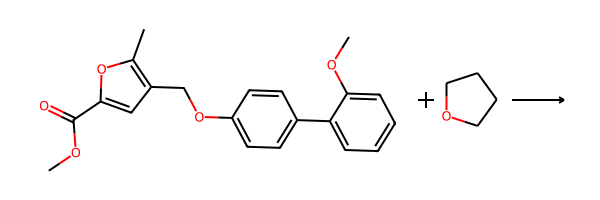

In [28]:
rxn1 = Reactions.ReactionFromSmarts("COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1.C1CCOC1>>", 
                useSmiles=True)
Draw.ReactionToImage(rxn1)

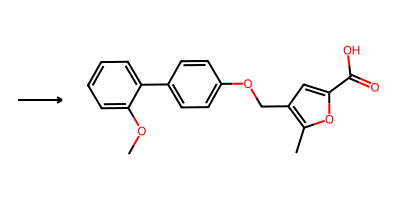

In [29]:
rxn2 = Reactions.ReactionFromSmarts(">>" + tokenizer.decode(output[0], skip_special_tokens=True), 
                useSmiles=True)
Draw.ReactionToImage(rxn2)

In [30]:
# Reactants
model  = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
inputs = tokenizer.encode("Reactants:COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1", return_tensors='pt')
output = model.generate(input_ids=inputs, max_length=300, early_stopping=True)
print("Reactants:", tokenizer.decode(output[0], skip_special_tokens=True)) # "COC(=O)c1cc(COc2ccc(I)cc2)c(C)o1.COc1ccccc1B(O)O"

Reactants: COC(=O)c1cc(COc2ccc(I)cc2)c(C)o1.COc1ccccc1B(O)O


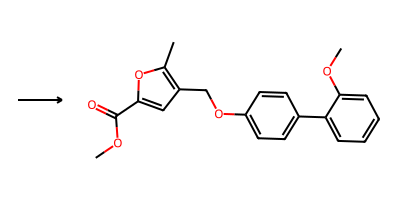

In [31]:
rxn = Reactions.ReactionFromSmarts(">>COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1",
                useSmiles=True)
Draw.ReactionToImage(rxn)

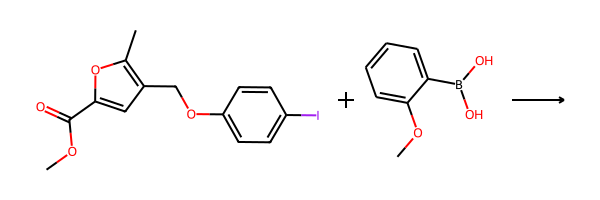

In [32]:
rxn = Reactions.ReactionFromSmarts(tokenizer.decode(output[0], skip_special_tokens=True) + ">>", 
                useSmiles=True)
Draw.ReactionToImage(rxn)

In [33]:
# Reagents
model  = T5ForConditionalGeneration.from_pretrained(model_path)    # for seq2seq tasks
inputs = tokenizer.encode("Reagents:COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1>>C1CCOC1", return_tensors='pt')
output = model.generate(input_ids=inputs, max_length=300, early_stopping=True)
print("Reagents:", tokenizer.decode(output[0], skip_special_tokens=True)) # "C1CCOC1.CCOC(C)=O.[Al+3].[H-].[H-].[H-].[H-].[Li+]"

Reagents: C1CCOC1.CCOC(C)=O.[Al+3].[H-].[H-].[H-].[H-].[Li+]


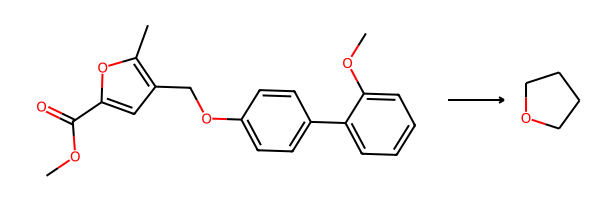

In [34]:
rxn = Reactions.ReactionFromSmarts("COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1>>C1CCOC1",
                useSmiles=True)
Draw.ReactionToImage(rxn)

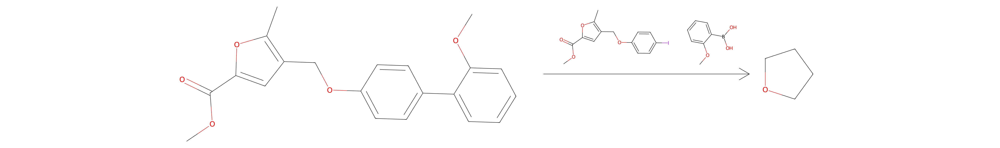

In [52]:
rxn = Reactions.ReactionFromSmarts("COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1>"+tokenizer.decode(output[0], skip_special_tokens=True)+">C1CCOC1",
                useSmiles=True)
Draw.ReactionToImage(rxn, subImgSize=(1800,800))

In [53]:
# Classify
xmodel = T5ForProperty.from_pretrained(model_path)
inputs = tokenizer.encode("Classification:COC(=O)c1cccc(C(=O)OC)c1>CN(C)N.Cl.O>COC(=O)c1cccc(C(=O)O)c1", 
                          return_tensors='pt')
outputs = xmodel(inputs)
print(outputs.logits.shape)
print("Class " + str(outputs.logits.argmax().item()))

torch.Size([1, 256])
Class 95


In [54]:
# Yield
ymodel = T5ForProperty.from_pretrained(model_path)
inputs = tokenizer.encode("Yield:Clc1ccccn1.Cc1ccc(N)cc1>[Pd]2(OS(=O)(=O)C(F)(F)F)>Cc1ccc(Nc2ccccn2)cc1", return_tensors='pt')
# Display
outputs = ymodel(inputs)
print(outputs.logits.shape)
print("Yield: %.2f" % (torch.exp(outputs.logits[:,-1])*100).item())

torch.Size([1, 256])
Yield: 175.69


In [55]:
# Predict yield
ymodel = T5ForProperty.from_pretrained(model_path)
inputs = tokenizer.encode(
    "Yield:Clc1ccccn1.Cc1ccc(N)cc1>CC(C)c1cc(C(C)C)c(-c2ccccc2P(C(C)(C)C)(C(C)(C)C)->[Pd]2(OS(=O)(=O)C(F)(F)F)<-Nc3ccccc3-c3ccccc32)c(C(C)C)c1.Cc1cc(C)on1.CN(C)C(=NC(C)(C)C)N(C)C.CS(C)=O>Cc1ccc(Nc2ccccn2)cc1", return_tensors='pt')
outputs = ymodel(inputs)
print(outputs.logits.shape)
print("Yield: %.2f" % (torch.exp(outputs.logits[:,-1])*100).item())

torch.Size([1, 256])
Yield: 248.61


In [56]:
# Visualize model statistics
summary(xmodel, verbose=0)
summary(ymodel, verbose=0)

Layer (type:depth-idx)                                  Param #
T5ForProperty                                           --
├─Embedding: 1-1                                        25,600
├─T5Stack: 1-2                                          25,600
│    └─Embedding: 2-1                                   (recursive)
│    └─ModuleList: 2-2                                  --
│    │    └─T5Block: 3-1                                1,573,632
│    │    └─T5Block: 3-2                                1,573,376
│    │    └─T5Block: 3-3                                1,573,376
│    │    └─T5Block: 3-4                                1,573,376
│    └─T5LayerNorm: 2-3                                 256
│    └─Dropout: 2-4                                     --
├─T5Stack: 1-3                                          25,600
│    └─Embedding: 2-5                                   (recursive)
│    └─ModuleList: 2-6                                  --
│    │    └─T5Block: 3-5                           

#### Notes
- Can't do inference on GPU
- Can be trained on GPU but that is tricky!

### 6) Visualize Attention

In [45]:
# Reactants
model_path = "../models/USPTO_500_MT/"
model      = T5ForConditionalGeneration.from_pretrained(model_path, output_attentions=True)    # for seq2seq tasks
tokenizer  = SimpleTokenizer(vocab_file=model_path + 'vocab.pt')
inputs = tokenizer.encode("Reactants:COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1", return_tensors='pt')
output = model.generate(input_ids=inputs, max_length=300, early_stopping=True)
print("Reactants:", tokenizer.decode(output[0], skip_special_tokens=True)) # "COC(=O)c1cc(COc2ccc(I)cc2)c(C)o1.COc1ccccc1B(O)O"

Reactants: COC(=O)c1cc(COc2ccc(I)cc2)c(C)o1.COc1ccccc1B(O)O


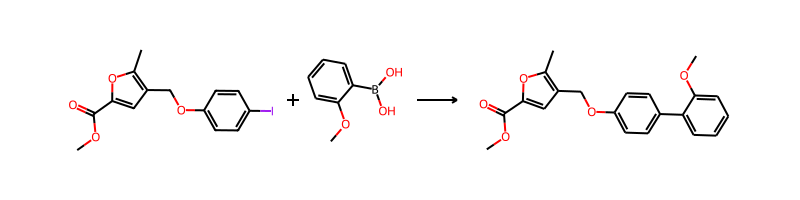

In [46]:
rxn = Reactions.ReactionFromSmarts(
    str(tokenizer.decode(output[0], 
                         skip_special_tokens=True)) + ">>COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1",
                useSmiles=True)
Draw.ReactionToImage(rxn)

In [47]:
# get encoded input vectors
encoder_input_ids = tokenizer(">>COC(=O)c1cc(COc2ccc(-c3ccccc3OC)cc2)c(C)o1", 
                              return_tensors="pt", add_special_tokens=True).input_ids

# create ids of encoded input vectors
decoder_input_ids = tokenizer("COC(=O)c1cc(COc2ccc(I)cc2)c(C)o1.COc1ccccc1B(O)O", 
                              return_tensors="pt", add_special_tokens=True).input_ids

outputs = model(input_ids=encoder_input_ids, decoder_input_ids=decoder_input_ids)

In [48]:
encoder_text = tokenizer.convert_ids_to_tokens(encoder_input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(decoder_input_ids[0])

In [49]:
model_view(
    encoder_attention=outputs.encoder_attentions,
    decoder_attention=outputs.decoder_attentions,
    cross_attention=outputs.cross_attentions,
    encoder_tokens= encoder_text,
    decoder_tokens=decoder_text,
    display_mode="light",
    include_layers=[3]
)

<IPython.core.display.Javascript object>

In [50]:
head_view(
    encoder_attention=outputs.encoder_attentions,
    decoder_attention=outputs.decoder_attentions,
    cross_attention=outputs.cross_attentions,
    encoder_tokens= encoder_text,
    decoder_tokens=decoder_text,
    layer=3,
    heads=[6,7]
)

<IPython.core.display.Javascript object>

### 7) Excercise - Measure BLEU

In this section, the goal is to measure the average BLEU score of T5Chem on USPTO-50k using different beam sizes and USPTO-50k samples:
- 100 samples
- 1000 samples 
- all 50k samples (you'll need a GPU for this)

using a
- beam of size 1 (greedy)
- beam of size 3
- beam of size 5

In [70]:
import pandas as pd
import os, sys
from collections import OrderedDict
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction, sentence_bleu
from tqdm import tqdm as tq
import ast

In [57]:
df = pd.read_csv('../datasets/uspto-50k/uspto50k-retrosyn.tsv', sep='\t')

In [58]:
df.head()

,source,target
0,COC(=O)CCC(=O)c1ccc(OC2CCCCO2)cc1O,['C1=COCCC1.COC(=O)CCC(=O)c1ccc(O)cc1O']
1,COC(=O)c1cccc(-c2nc3cccnc3[nH]2)c1,['COC(=O)c1cccc(C(=O)O)c1.Nc1cccnc1N']
2,CON(C)C(=O)C1CCC(NC(=O)OC(C)(C)C)CC1,['CC(C)(C)OC(=O)NC1CCC(C(=O)O)CC1.CNOC']
3,O=[N+]([O-])c1ccc(Cl)nc1Nc1ccc(O)cc1,['Nc1ccc(O)cc1.O=[N+]([O-])c1ccc(Cl)nc1Cl']
4,NCC1=CC[C@@H](c2ccc(Cl)cc2Cl)[C@H]([N+](=O)[O-...,['[N-]=[N+]=NCC1=CC[C@@H](c2ccc(Cl)cc2Cl)[C@H]...


In [62]:
model_path = "../models/USPTO_500_MT/"
model      = T5ForConditionalGeneration.from_pretrained(model_path, output_attentions=True)    # for seq2seq tasks
tokenizer  = SimpleTokenizer(vocab_file=model_path + 'vocab.pt')

In [63]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print('Using device:', device)
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

Using device: cpu


In [65]:
def decode_sequence_beam(xinput_seq, model, max_length, beam_size):
    '''
    Decode reactants using beam-search.
    '''
    input_seq = "Reactants:" + xinput_seq
    inputs = tokenizer.encode(input_seq, return_tensors='pt').to(device)
    outputs = model.generate(input_ids=inputs, 
                        max_length=max_length,
                        output_scores=False,
                        early_stopping=True,
                        num_beams=beam_size,
                        return_dict_in_generate=True,
                        num_return_sequences=1,
                        )
    result = ""
    for i, pred in enumerate(outputs.sequences):
        result = result + tokenizer.decode(pred, skip_special_tokens=True)
    return result

def evaluate(N, K, model, inputs, targets, max_length=100):
    '''
    Measure BLEU sentence by sentence, and then return average
    For each prediction in the beam, pick the highest.
    We evaluate predictions on N samples on a beam of size K
    using BLEU-4 in different variations.
    '''
    print()
    # we use BLEU
    chc  = SmoothingFunction()
    smooth = chc.method2 # Laplace (+1) smoothing for proportion estimators
    # local variables to save intermediate results
    preds = []
    refs = []
    pred = []        
    for seqs_index in tq(range(N)):
        # populate predictions vs. targets for BLEU
        xinput_seq      = inputs[seqs_index]
        target_seqs     = ast.literal_eval(targets[seqs_index])
        best_decoding   = decode_sequence_beam(xinput_seq, model, max_length, K)
        pred_sent       = list(best_decoding)
        ref_sents       = [list(s) for s in target_seqs]
        pred.append(pred_sent)
        refs.append(ref_sents)            
        preds.append(best_decoding)
    '''
    **Missing**: call to NLTK's BLEU function with Laplace smoothing (see:
    https://www.nltk.org/_modules/nltk/translate/bleu_score.html) 
    to set up the variable `bleu` referred by the print statement.
    '''
    # compute BLEU and print results
    print('results:     BLEU-4: (macro w. variants) %s' %bleu, '\tbeam size: %s' %K, '\tsamples: %s' %N)
    print('source:      %s' %inputs[0:min(10,N)])
    print('predicted:   %s' %preds[0:min(10,N)])
    print('target:      %s' %targets[0:min(10,N)])

In [72]:
# evaluate(10,2, model, df.source.values, df.target.values)